# LBPH (Local Binary Patterns Histograms)

Suppose we have a window of an image

\begin{bmatrix}
12 & 15 & 18 \\ 
 5 &  8 & 3  \\ 
 8 &  1 & 2
\end{bmatrix}

Now we select the central therm

\begin{bmatrix}
12 & 15  & 18 \\ 
 5 & (8) & 3  \\ 
 8 &  1 & 2
\end{bmatrix}

And apply a condition for all values (except for the central therm)
- if $\geq$ 8 : 1
- if $<$ 8 : 0 

The result will be

\begin{bmatrix}
1 &  1  & 1 \\ 
0 & (8) & 0 \\ 
1 &  0  & 0
\end{bmatrix}

Now, starting with the first therm (line 1, column 1), in clockwise we take the numbers and transform in only one binary number

$11100010_2 = 226_{10}$

After this, the central value is changed to the decimal value

\begin{bmatrix}
12 & 15  & 18 \\ 
 5 & (226) & 3  \\ 
 8 &  1 & 2
\end{bmatrix}

For each window, we generate a Histogram and for recognition we use the histograms to compare


This algorithm is quite robust with respect to lighting. 

If we have an image in dark, the other algorithms will have some dificult to classify when that image is in light.

In the past case, if we light the window, we will have shomething like this

\begin{bmatrix}
42 &  55  & 48 \\ 
35 & (38) & 33 \\ 
38 &  30  & 32
\end{bmatrix}

Applying the condition and others operations, we will have the same binary number

In [1]:
import os
import dlib

from PIL             import Image
from sklearn.metrics import accuracy_score, confusion_matrix

import cv2     as cv
import numpy   as np
import zipfile as zf

import matplotlib.pyplot as plt
import seaborn           as sns

from google.colab.patches import cv2_imshow
from google.colab         import drive

drive.mount("/content/drive")

Mounted at /content/drive


# Load data

- Yale faces database

In [2]:
yale_path = "/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Recognition/images/yalefaces.zip"

In [3]:
zip_object = zf.ZipFile(file=yale_path, mode="r")

zip_object.extractall("./")
zip_object.close()

# Image preprocessing

Changing image format for the algorithm

In [4]:
os.listdir("/content/yalefaces/train/")[:10]

['subject08.glasses.gif',
 'subject12.wink.gif',
 'subject08.leftlight.gif',
 'subject14.rightlight.gif',
 'subject14.wink.gif',
 'subject02.wink.gif',
 'subject04.normal.gif',
 'subject07.centerlight.gif',
 'subject15.glasses.gif',
 'subject14.noglasses.gif']

In [5]:
type(Image.open("/content/yalefaces/train/subject13.rightlight.gif"))

PIL.GifImagePlugin.GifImageFile

The images are in PIL (Python Imaging Library) "format", we need them in numpy format.

In [6]:
type(np.array(Image.open("/content/yalefaces/train/subject13.rightlight.gif"), "uint8"))

numpy.ndarray

Now, we need to find the id's of the images. For this, we will catch the id from the path.

In [7]:
print("/content/yalefaces/train/subject13.rightlight.gif".split("."))
print("/content/yalefaces/train/subject13.rightlight.gif".split(".")[0].split("/"))
print("/content/yalefaces/train/subject13.rightlight.gif".split(".")[0].split("/")[-1].replace("subject", ""))

['/content/yalefaces/train/subject13', 'rightlight', 'gif']
['', 'content', 'yalefaces', 'train', 'subject13']
13


In [8]:
def get_image_data():
  paths = [os.path.join(f"/content/yalefaces/train/{file}") for file in os.listdir("/content/yalefaces/train/")]
  faces = []
  ids   = []

  for path in paths:
    image = Image.open(path).convert('L') #open image and convert to grayscale
    image = np.array(image, "uint8")

    id = int(path.split('.')[0].split('/')[-1].replace("subject", ''))

    ids.append(id)
    faces.append(image)

  return np.array(ids), faces

In [9]:
ids, faces = get_image_data()

In [10]:
ids

array([ 8, 12,  8, 14, 14,  2,  4,  7, 15, 14,  8,  7,  9,  8,  5, 13,  3,
        2,  2, 13, 10,  7, 12, 12, 11, 11,  2,  7, 13,  6,  2, 10,  1,  9,
        7, 11, 15,  4,  3,  5, 10,  6, 10,  7,  4,  4, 11,  1, 15, 14,  6,
        5, 10, 12, 15,  6, 13, 11,  7,  6,  4, 14, 14,  8, 14,  8, 15,  5,
        3,  4, 13, 12,  5,  5,  1,  7,  9,  8,  8,  9,  4,  9,  5, 13, 11,
        6, 13, 13, 14,  1,  6,  3,  9,  2,  3,  2, 15,  1,  1, 11,  9,  5,
        2,  1,  1,  5,  8,  3,  9,  1,  2,  3, 15,  6,  4, 12,  3,  6, 10,
        3, 15, 14, 10, 12, 11,  9, 12,  4, 15, 10, 13, 12, 11, 10,  7])

In [11]:
len(ids)

135

In [12]:
len(faces)

135

In [13]:
faces[0]

array([[130, 130, 130, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 245, 237],
       [255, 255, 255, ..., 255, 238, 235],
       [ 68,  68,  68, ...,  68,  68,  68]], dtype=uint8)

In [14]:
faces[0].shape

(243, 320)

The shape is in 2 dimensions. That means that images are in grayscale

# Training the LBPH classifier

In [15]:
lbph_classifier = cv.face.LBPHFaceRecognizer_create()

In [16]:
lbph_classifier.train(faces, ids)

In [17]:
lbph_classifier.write("lbph_classifier.yml")

# Testing the LBPH classifier

In [18]:
lbph_face_classifier = cv.face.LBPHFaceRecognizer_create()

In [19]:
lbph_face_classifier.read("/content/lbph_classifier.yml")

In [20]:
test_image = "/content/yalefaces/test/subject10.sad.gif"

In [21]:
image = Image.open(test_image).convert('L')
image = np.array(image, "uint8")

image

array([[130, 130, 130, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 241, 255, 255],
       [255, 255, 255, ..., 234, 237, 252],
       [ 68,  68,  68, ...,  68,  68,  68]], dtype=uint8)

In [22]:
image.shape

(243, 320)

In [23]:
predict  = lbph_face_classifier.predict(image)
expected = test_image.split('.')[0].split('/')[-1].replace("subject", '')

print("Class  predicted: ", predict[0])
print("Confidence: ", predict[1])

Class  predicted:  10
Confidence:  6.384336446373091


The chosed image was "subject10", that is the model has predicted correctly.

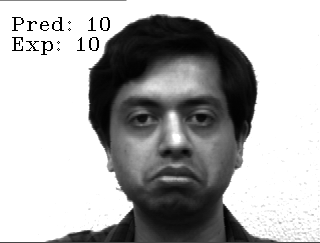

In [24]:
cv.putText(image, f"Pred: {predict[0]}", (10, 30), cv.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 255, 0))
cv.putText(image, f"Exp: {expected}", (10, 50), cv.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 255, 0))
cv2_imshow(image)

## Rating the classifier

In [25]:
paths      = [os.path.join(f"/content/yalefaces/test/{file}") for file in os.listdir("/content/yalefaces/test/")]
predicted  = []
expected   = []

for path in paths:
  image = Image.open(path).convert('L')
  image = np.array(image, "uint8")

  pred, _ = lbph_face_classifier.predict(image)

  expected.append(int(path.split('.')[0].split('/')[-1].replace("subject", '')))
  predicted.append(pred)

expected  = np.array(expected)
predicted = np.array(predicted)

In [26]:
acc = round(accuracy_score(expected, predicted), 2)

print("Acurácia: ", acc)

Acurácia:  0.67


In [27]:
print("Number of images correctly classified: ", int(len(predicted) * acc))

Number of images correctly classified:  20


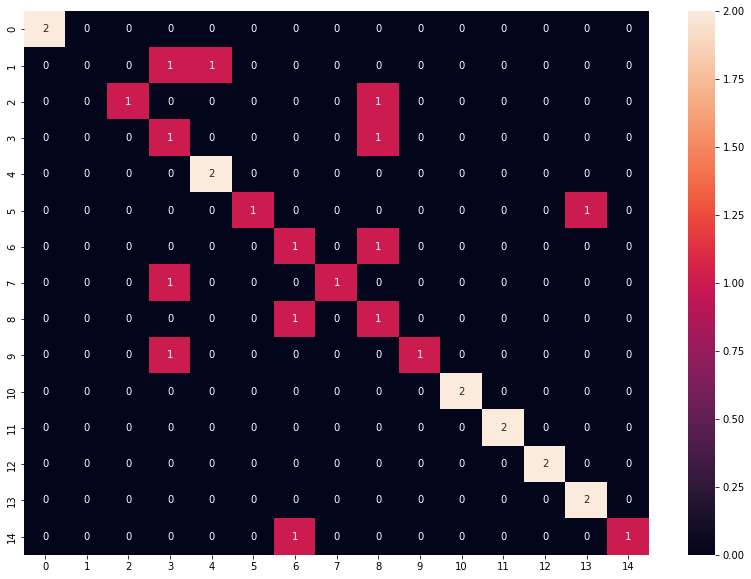

In [28]:
cm = confusion_matrix(expected, predicted)

plt.figure(figsize=(14, 10))

sns.heatmap(cm, annot=True)

plt.show()

# Some LBPH parameters

1. Radius

  <p>
    <img width=550 src="https://www.researchgate.net/publication/343956462/figure/fig4/AS:938358129819649@1600733420097/Neighbors-obtained-in-different-radius-R-and-the-number-of-neighbors-P-a-R-1-P.png">
  </p>

  Delimites the central value and the range for apply the binary condition. A big value for the radius can loss some edges informations. Nonetheless, we can find more patterns (that will need more time because the processment capacity will be higher)

2. Neighbors

  Looks like the radius parameter, but the neighbors are the exact number of pixels used around the central value

3. grid_x and grid_y

  That two parameters will indicate the shape of grid to generate the histograms

  $grid_x \cdot grid_y = n_{hist}$

  Where $n_{hist}$ will be the number of generated histograms

4. Treshold

  The treshold will indicate the confidence of prediction

## Changing the parameters to see the behavior

By default, `cv.face.LBPHFaceRecognizer_create()` will have the following values of parameters

- `threshold` :

In [29]:
cv.face.LBPHFaceRecognizer_create().getThreshold()

1.7976931348623157e+308

- `radius` : 

In [30]:
cv.face.LBPHFaceRecognizer_create().getRadius()

1

- `neighbors` : 

In [31]:
cv.face.LBPHFaceRecognizer_create().getNeighbors()

8

- `grid_x` : 

In [32]:
cv.face.LBPHFaceRecognizer_create().getGridX()

8

- `grid_y` : 

In [33]:
cv.face.LBPHFaceRecognizer_create().getGridY()

8

### Testing changes

#### Change 1

- `threshold = default`
- `radius = 2`
- `neighbors = 5`
- `grid_x = 5`
- `grid_y = 5`

In [34]:
lbph_classifier = cv.face.LBPHFaceRecognizer_create(radius=2, neighbors=5, grid_x=5, grid_y=5)

lbph_classifier.train(faces, ids)
lbph_classifier.write("lbph_classifier.yml")

In [35]:
lbph_face_classifier = cv.face.LBPHFaceRecognizer_create()

lbph_face_classifier.read("/content/lbph_classifier.yml")

test_image = "/content/yalefaces/test/subject10.sad.gif"
image      = Image.open(test_image).convert('L')
image      = np.array(image, "uint8")

In [36]:
paths      = [os.path.join(f"/content/yalefaces/test/{file}") for file in os.listdir("/content/yalefaces/test/")]
predicted  = []
expected   = []

for path in paths:
  image = Image.open(path).convert('L')
  image = np.array(image, "uint8")

  pred, _ = lbph_face_classifier.predict(image)

  expected.append(int(path.split('.')[0].split('/')[-1].replace("subject", '')))
  predicted.append(pred)

expected  = np.array(expected)
predicted = np.array(predicted)

In [37]:
acc = round(accuracy_score(expected, predicted), 2)

print("Acurácia: ", acc)

Acurácia:  0.6


In [38]:
print("Number of images correctly classified: ", int(len(predicted) * acc))

Number of images correctly classified:  18


The algorithm performance got worse

#### Change 2

- `threshold = default`
- `radius = 3`
- `neighbors = 12`
- `grid_x = default`
- `grid_y = default`

In [39]:
lbph_classifier = cv.face.LBPHFaceRecognizer_create(radius=3, neighbors=12)

lbph_classifier.train(faces, ids)
lbph_classifier.write("lbph_classifier.yml")

In [40]:
lbph_face_classifier = cv.face.LBPHFaceRecognizer_create()

lbph_face_classifier.read("/content/lbph_classifier.yml")

test_image = "/content/yalefaces/test/subject10.sad.gif"
image      = Image.open(test_image).convert('L')
image      = np.array(image, "uint8")

In [41]:
paths      = [os.path.join(f"/content/yalefaces/test/{file}") for file in os.listdir("/content/yalefaces/test/")]
predicted  = []
expected   = []

for path in paths:
  image = Image.open(path).convert('L')
  image = np.array(image, "uint8")

  pred, _ = lbph_face_classifier.predict(image)

  expected.append(int(path.split('.')[0].split('/')[-1].replace("subject", '')))
  predicted.append(pred)

expected  = np.array(expected)
predicted = np.array(predicted)

In [42]:
acc = round(accuracy_score(expected, predicted), 2)

print("Acurácia: ", acc)

Acurácia:  0.63


In [43]:
print("Number of images correctly classified: ", int(len(predicted) * acc))

Number of images correctly classified:  18


It's better than the first change, but worse than the default values

#### Change 3

- `threshold = default`
- `radius = 4`
- `neighbors = 14`
- `grid_x = 9`
- `grid_y = 9`

In [44]:
lbph_classifier = cv.face.LBPHFaceRecognizer_create(radius=4, neighbors=14, grid_x=9, grid_y=9)

lbph_classifier.train(faces, ids)
lbph_classifier.write("lbph_classifier.yml")

In [45]:
lbph_face_classifier = cv.face.LBPHFaceRecognizer_create()

lbph_face_classifier.read("/content/lbph_classifier.yml")

test_image = "/content/yalefaces/test/subject10.sad.gif"
image      = Image.open(test_image).convert('L')
image      = np.array(image, "uint8")

In [46]:
paths      = [os.path.join(f"/content/yalefaces/test/{file}") for file in os.listdir("/content/yalefaces/test/")]
predicted  = []
expected   = []

for path in paths:
  image = Image.open(path).convert('L')
  image = np.array(image, "uint8")

  pred, _ = lbph_face_classifier.predict(image)

  expected.append(int(path.split('.')[0].split('/')[-1].replace("subject", '')))
  predicted.append(pred)

expected  = np.array(expected)
predicted = np.array(predicted)

In [47]:
acc = round(accuracy_score(expected, predicted), 2)

print("Acurácia: ", acc)

Acurácia:  0.7


In [48]:
print("Number of images correctly classified: ", int(len(predicted) * acc))

Number of images correctly classified:  21


It's better than the other values

# Dlib approach

In [49]:
face_detector   = dlib.get_frontal_face_detector()
points_detector = dlib.shape_predictor("/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Recognition/weights/shape_predictor_68_face_landmarks.dat")

"shape_predictor_68_face_landmarks" is because the algorithm will return 68 points for each face detected

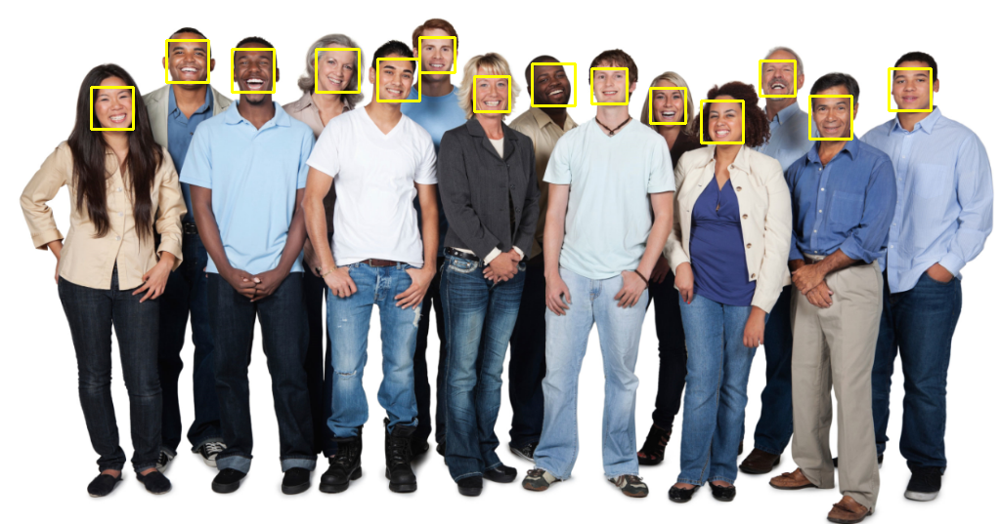

In [50]:
image      = cv.imread("/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Recognition/images/people2.jpg")
detections = face_detector(image, 1)

for face in detections:
  l, r, t, b  = face.left(), face.right(), face.top(), face.bottom()

  cv.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)

cv2_imshow(image)

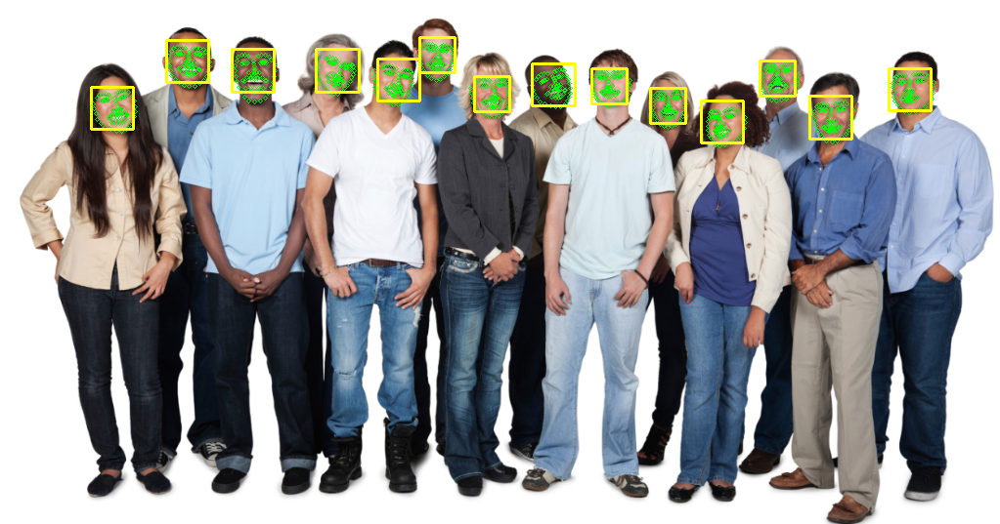

In [51]:
image      = cv.imread("/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Recognition/images/people2.jpg")
detections = face_detector(image, 1)

for face in detections:
  points = points_detector(image, face)

  for point in points.parts():
    cv.circle(image, (point.x, point.y), 2, (0, 255, 0), 1)

  l, r, t, b  = face.left(), face.right(), face.top(), face.bottom()

  cv.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)

cv2_imshow(image)

## Face descriptors

In [52]:
face_detector   = dlib.get_frontal_face_detector()
points_detector = dlib.shape_predictor("/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Recognition/weights/shape_predictor_68_face_landmarks.dat")
face_descriptor = dlib.face_recognition_model_v1("/content/drive/MyDrive/Colab Notebooks/Computer_Vision/Face_Recognition/weights/dlib_face_recognition_resnet_model_v1.dat")

ResNet (Residual Neural Network) is a Covolutional structure quite used for image recognition. For the use with dlib, we need to change the hardware accelerator for GPU.

For each face the ResNet will receive the 68 points and will return 128 numbers/features. That 128 numbers will be the face descriptor.

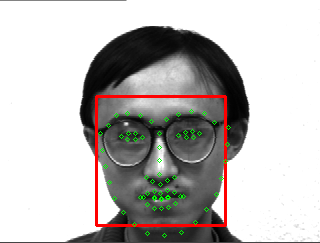

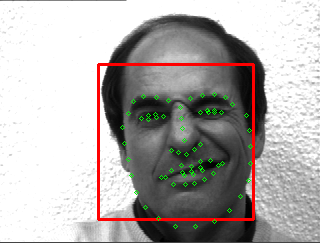

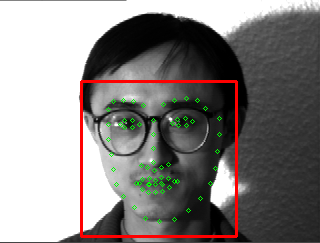

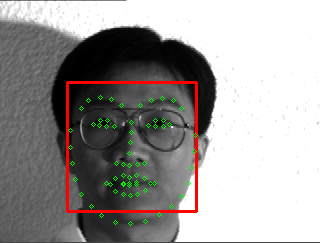

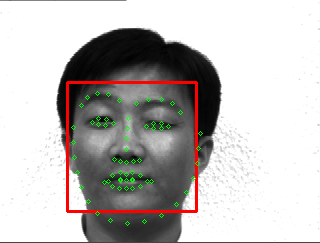

...

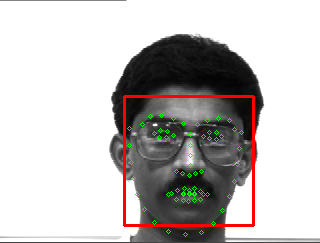

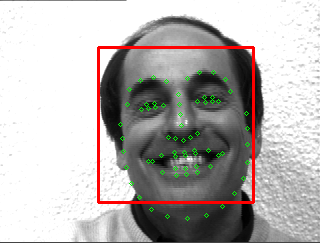

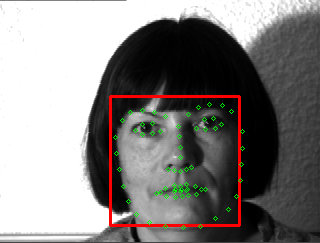

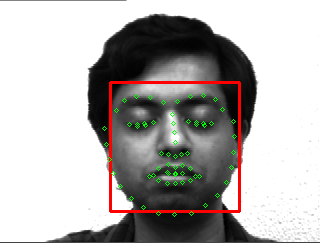

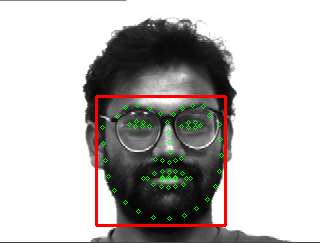

In [53]:
index = {}
idx   = 0

face_descriptors = None

paths = [os.path.join(f"/content/yalefaces/train/{file}") for file in os.listdir("/content/yalefaces/train/")]

for path in paths:
  image = Image.open(path).convert("RGB") #In dlib its not necessary convert to grayscale
  image = np.array(image, "uint8")

  detections = face_detector(image, 1)

  for face in detections:
    l, r, t, b  = face.left(), face.right(), face.top(), face.bottom()

    cv.rectangle(image, (l, t), (r, b), (0, 0, 255), 2)

    points = points_detector(image, face)

    for point in points.parts():
      cv.circle(image, (point.x, point.y), 2, (0, 255, 0), 1)
    
    face_description = face_descriptor.compute_face_descriptor(image, points)
    face_description = np.array([f for f in face_description], "float64")
    face_description = face_description[np.newaxis, :]

    if face_descriptors is None:
      face_descriptors = face_description
    else:
      face_descriptors = np.concatenate((face_descriptors, face_description), axis=0)

    index[idx] = path
    idx += 1

  cv2_imshow(image)

### Calculation of the distance between the facial descriptors

In [54]:
index[131]

'/content/yalefaces/train/subject07.glasses.gif'

In [55]:
face_descriptors[131]

array([-0.11009464,  0.07761928,  0.08779076, -0.02456062, -0.06359645,
       -0.02692495,  0.0515149 , -0.04123879,  0.19849008, -0.0661282 ,
        0.23730475,  0.007109  , -0.20158942, -0.10709287,  0.01141971,
        0.10410395, -0.14391658, -0.11569037, -0.09383923, -0.09872001,
        0.00548221, -0.00744315,  0.03169734, -0.00783438, -0.18268424,
       -0.39826137, -0.07364233, -0.12173938, -0.0018504 , -0.13927823,
        0.02078569,  0.05085421, -0.17678672, -0.05125246, -0.10708465,
        0.07793085, -0.09290052, -0.10110203,  0.20035803,  0.03562913,
       -0.15917295, -0.0607786 , -0.00915178,  0.29921377,  0.17596611,
       -0.0244135 ,  0.03359938,  0.04908911,  0.02557696, -0.2476404 ,
        0.0769304 ,  0.10815483,  0.07557494,  0.04908213,  0.05084256,
       -0.06470998, -0.02518106,  0.05778491, -0.17093125,  0.01172146,
        0.03402825, -0.08346672, -0.06907848, -0.02980782,  0.23872533,
        0.16463538, -0.06864601, -0.02491491,  0.13176593, -0.16

We can use the norm measurement to calculate the similarity between two faces. The smaller the value, the greater the similarity

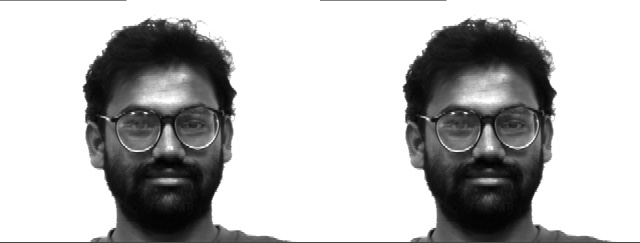


Norm:  0.0


In [56]:
img_1 = Image.open(index[131]).convert("RGB") 
img_2 = Image.open(index[131]).convert("RGB")

concat = np.concatenate((img_1, img_2), axis=1)
norm   = np.linalg.norm(face_descriptors[131] - face_descriptors[131])

cv2_imshow(concat)

print("\nNorm: ", norm)

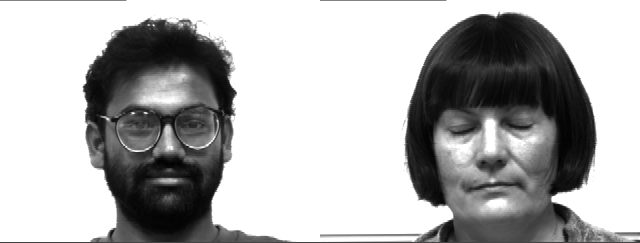


Norm:  0.7180658426635802


In [57]:
img_1 = Image.open(index[131]).convert("RGB") 
img_2 = Image.open(index[121]).convert("RGB")

concat = np.concatenate((img_1, img_2), axis=1)
norm   = np.linalg.norm(face_descriptors[131] - face_descriptors[121])

cv2_imshow(concat)

print("\nNorm: ", norm)

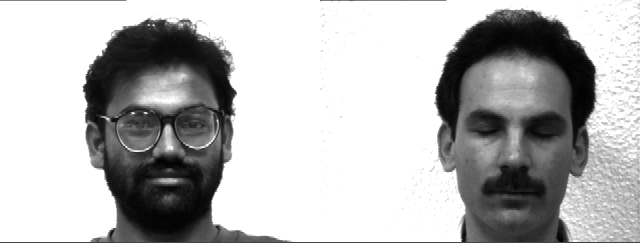


Norm:  0.6647542980069854


In [58]:
img_1 = Image.open(index[131]).convert("RGB") 
img_2 = Image.open(index[107]).convert("RGB")

concat = np.concatenate((img_1, img_2), axis=1)
norm   = np.linalg.norm(face_descriptors[131] - face_descriptors[107])

cv2_imshow(concat)

print("\nNorm: ", norm)

So, to calculate a person we need to see all norm values

In [59]:
norms = np.linalg.norm(face_descriptors[131] - face_descriptors, axis=1)

norms

array([0.7001744 , 0.78345559, 0.68294034, 0.61598448, 0.69577091,
       0.73592777, 0.75890826, 0.42761642, 0.71748886, 0.66551914,
       0.6968406 , 0.39627552, 0.63317733, 0.77356821, 0.82039674,
       0.60827222, 0.82913008, 0.66793654, 0.75291309, 0.5830673 ,
       0.59589412, 0.40859727, 0.83730783, 0.82483386, 0.67096918,
       0.66564492, 0.68046545, 0.40859727, 0.5533124 , 0.70161899,
       0.69244953, 0.54302004, 0.73656736, 0.69475873, 0.42883669,
       0.67044222, 0.75890826, 0.8081568 , 0.84423631, 0.53182897,
       0.7064108 , 0.59623842, 0.43619363, 0.68065797, 0.75426258,
       0.70167183, 0.79641166, 0.71478798, 0.59105882, 0.66481259,
       0.57891713, 0.79912376, 0.68998594, 0.71212799, 0.53490958,
       0.721524  , 0.46732367, 0.61906896, 0.73021812, 0.63027529,
       0.65485541, 0.73367361, 0.57947877, 0.71404072, 0.65045014,
       0.83621283, 0.85119387, 0.81521267, 0.57274132, 0.82004662,
       0.83302186, 0.76283362, 0.38074677, 0.66556891, 0.71768

Now we need to take the min value (except of the self value)

In [60]:
min_idx = np.argmax(norms)

for idx, norm in enumerate(norms):
  if norm < norms[min_idx] and norm != 0:
    min_idx = idx

min_idx

72

Let's see

Subject 10



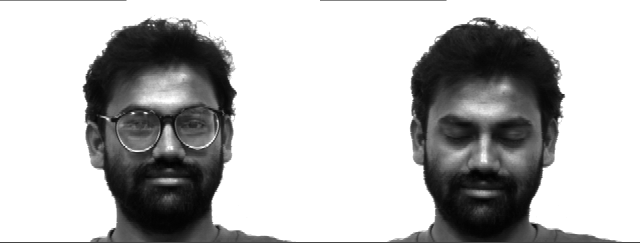


Norm:  0.38074677357312764


In [61]:
img_1 = Image.open(index[131]).convert("RGB") 
img_2 = Image.open(index[min_idx]).convert("RGB")

concat = np.concatenate((img_1, img_2), axis=1)
norm   = np.linalg.norm(face_descriptors[131] - face_descriptors[min_idx])

print("Subject 10\n")

cv2_imshow(concat)

print("\nNorm: ", norm)

## Face recognition in Dlib

In [62]:
MIN_NORM = 0.5

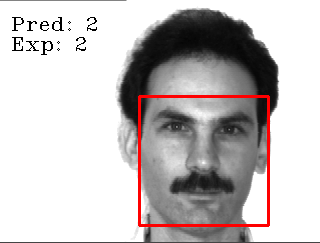

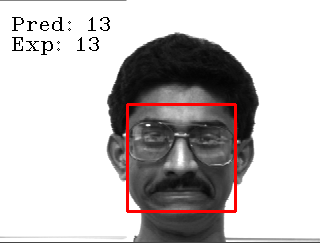

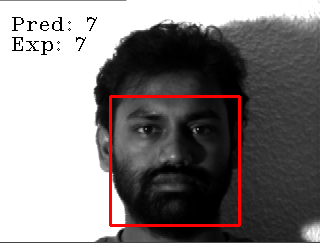

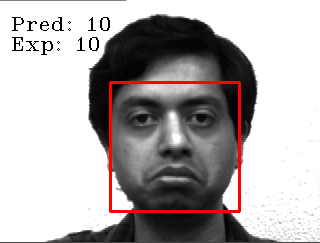

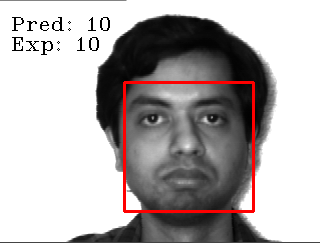

...

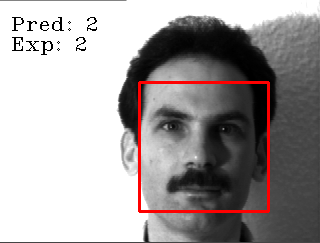

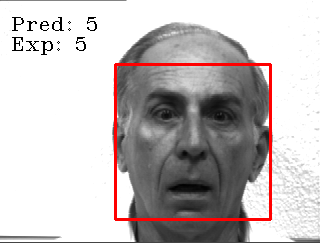

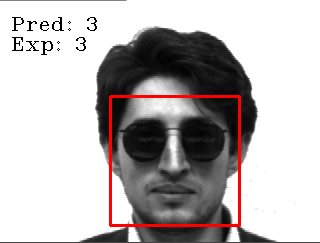

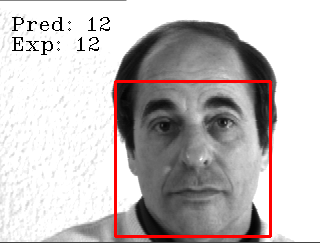

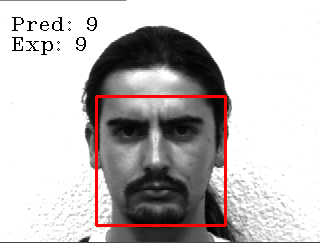

In [63]:
paths = [os.path.join(f"/content/yalefaces/test/{file}") for file in os.listdir("/content/yalefaces/test/")]

expected  = []
predicted = []

for path in paths:
  image = Image.open(path).convert("RGB")
  image = np.array(image, "uint8")

  detections = face_detector(image, 1)

  for face in detections:
    l, r, t, b  = face.left(), face.right(), face.top(), face.bottom()

    cv.rectangle(image, (l, t), (r, b), (0, 0, 255), 2)

    points = points_detector(image, face)
    
    face_description = face_descriptor.compute_face_descriptor(image, points)
    face_description = np.array([f for f in face_description], "float64")
    face_description = face_description[np.newaxis, :]

    norms   = np.linalg.norm(face_description - face_descriptors, axis=1)
    min_idx = np.argmax(norms)

    for idx, norm in enumerate(norms):
      if norm < norms[min_idx] and norm != 0:
        min_idx = idx

    min_norm = norms[min_idx]

    subject_id_real = int(path.split('.')[0].split('/')[-1].replace("subject", ''))
    expected.append(subject_id_real)

    if min_norm <= MIN_NORM:
      subject_id_pred = int(index[min_idx].split('.')[0].split('/')[-1].replace("subject", ''))
    else:
      subject_id_pred = -1 #Face not recognized

    predicted.append(subject_id_pred)

  cv.putText(image, f"Pred: {subject_id_pred}", (10, 30), cv.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 0))
  cv.putText(image, f"Exp: {subject_id_real}", (10, 50), cv.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 0))

  cv2_imshow(image)

In [64]:
expected  = np.array(expected)
predicted = np.array(predicted)

In [65]:
accuracy_score(expected, predicted)

1.0

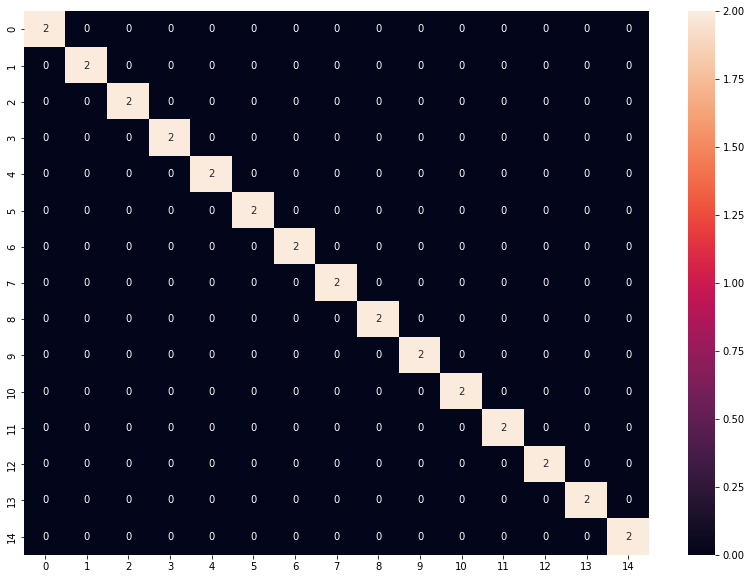

In [66]:
cm = confusion_matrix(expected, predicted)

plt.figure(figsize=(14, 10))

sns.heatmap(cm, annot=True)

plt.show()

# Referencies

https://www.python.org/

https://pillow.readthedocs.io/en/stable/reference/Image.html

https://opencv.org/

http://dlib.net/python/index.html

https://docs.opencv.org/3.4/df/d25/classcv_1_1face_1_1LBPHFaceRecognizer.html

https://towardsdatascience.com/face-recognition-how-lbph-works-90ec258c3d6b

https://www.udemy.com/share/105kta3@ooAfVkatgqpSKV1VF16mPNNje_G4hKtgyPgGU8RyXnIOwR4LhxSq-Ky4SgHKJdHuLA==/

https://www.researchgate.net/figure/Neighbors-obtained-in-different-radius-R-and-the-number-of-neighbors-P-a-R-1-P_fig4_343956462

https://arxiv.org/pdf/1512.03385.pdf

https://matplotlib.org/

https://seaborn.pydata.org/

https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics

https://www.researchgate.net/publication/327980768_LBPH_Based_Improved_Face_Recognition_At_Low_Resolution

https://ieeexplore.ieee.org/document/8396183

https://www.researchgate.net/publication/333511197_LBPH-based_Enhanced_Real-Time_Face_Recognition

https://www.researchgate.net/publication/233864740_Face_Recognition_A_Literature_Review

https://pyimagesearch.com/2018/06/18/face-recognition-with-opencv-python-and-deep-learning/
